In [6]:
#imports
import cv2
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline

In [7]:
#1.1
# Read grayscale image
img = cv2.imread('edgetest_23.png', cv2.IMREAD_GRAYSCALE)

print("Resolution: ", img.shape)
print("Range: %d - %d " % (img.min(), img.max()))

Resolution:  (512, 512)
Range: 0 - 255 


In [8]:
# Normalize to [0,1]
i0 = img.astype(float)/255

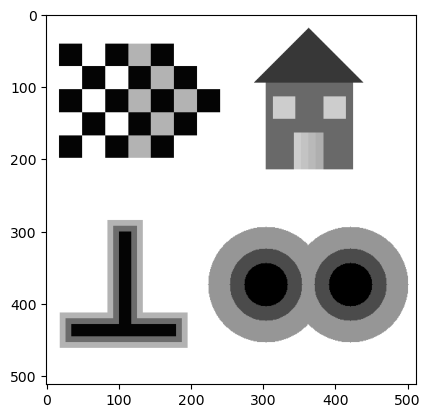

In [9]:
# Show image
plt.imshow(i0, cmap='gray')

In [10]:
imax = np.amax(i0)
imin = np.amin(i0)

sigma20 = (imax - imin)/10          #solved for sigma  
sigma10 = (imax - imin)/np.sqrt(10)

print(sigma20)
print(sigma10)

noise20 = np.random.normal(0, sigma20, i0.shape).reshape(i0.shape)
noise10 = np.random.normal(0, sigma10, i0.shape).reshape(i0.shape)
i20 = i0 + noise20
i10 = i0 + noise10

0.1
0.31622776601683794


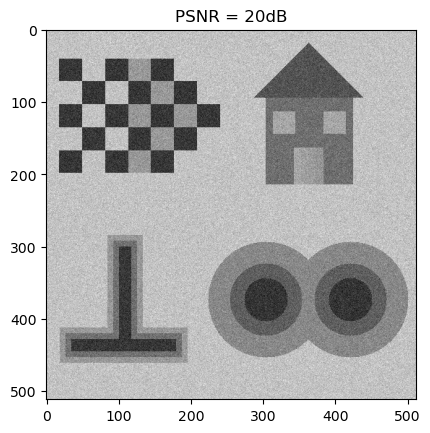

In [11]:
plt.imshow(i20, cmap='gray')
plt.title("PSNR = 20dB")
plt.show()

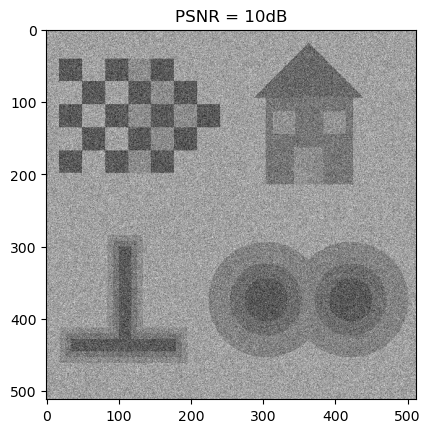

In [12]:
plt.imshow(i10, cmap='gray')
plt.title("PSNR = 10dB")
plt.show()

In [13]:
#1.2
def GaussKernel(sigma):
    n = int(np.ceil(3*sigma)*2+1)
    
    k = cv2.getGaussianKernel(n, sigma) 
    kernel = k @ k.T
    
    kernel /= np.sum(kernel) #normalize
    return kernel

In [14]:
def logf(sigma):
    n = int(np.ceil(3*sigma)*2+1)
    
    lin = np.linspace(-n//2+1, n//2, n)
    x, y = np.meshgrid(lin, lin)
    
    kernel = -(1/(np.pi*sigma**4)) * (1 - ((x**2 + y**2)/(2*sigma**2))) * np.exp(-(x**2 + y**2)/(2*sigma**2))
    
    kernel /= np.sum(np.abs(kernel))
    return kernel

In [15]:
def logf_alt(sigma):
    n = int(np.ceil(3*sigma)*2+1)
    k = cv2.getGaussianKernel(n, sigma) 
    k = k @ k.T
    kernel = cv2.Laplacian(k, cv2.CV_64F)
    kernel /= np.sum(np.abs(kernel))
    return kernel

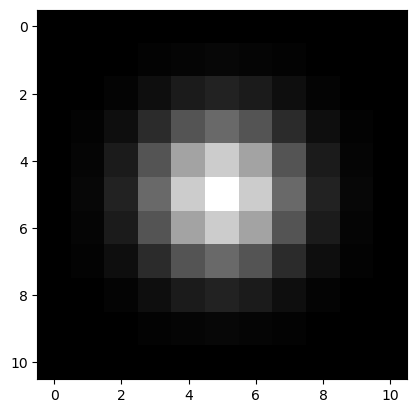

In [16]:
plt.imshow(GaussKernel(1.5),cmap='gray')

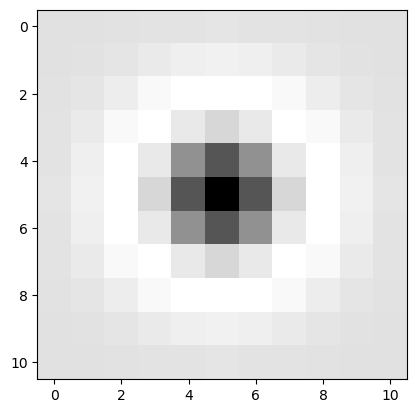

In [17]:
plt.imshow(logf(1.5),cmap='gray')

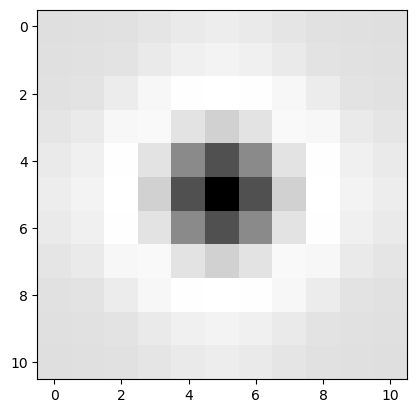

In [18]:
plt.imshow(logf_alt(1.5),cmap='gray')

In [19]:
def filteredimg(image, sigma):     
    imglog1 = cv2.filter2D(image, -1, logf(sigma))          #L1
    imglog2 = cv2.filter2D(image, -1, logf_alt(sigma))      #L1_alt
    smoothed = cv2.filter2D(image, -1, GaussKernel(sigma))

    return imglog1, imglog2, smoothed

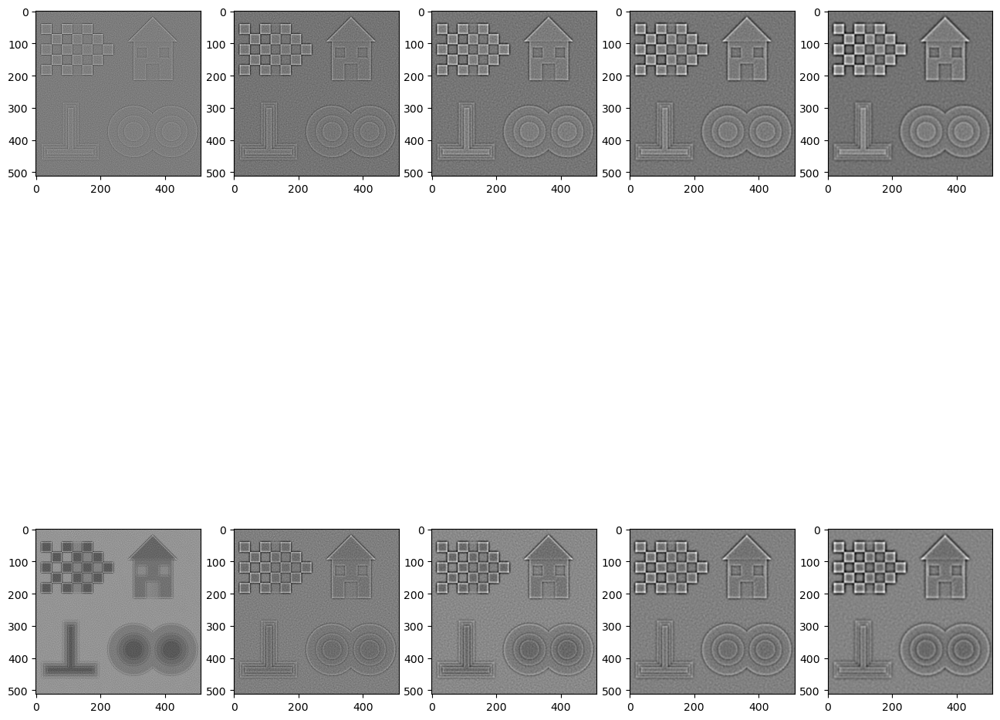

In [20]:
#linear 
fig, axs = plt.subplots(nrows=2, ncols=5, figsize=(16, 16))
for i in range(2, 7):
    sigma = i * 0.5
    output1, output2, _ = filteredimg(i20, sigma)
    axs[0][i-2].imshow(output1, cmap='gray')
    axs[1][i-2].imshow(output2, cmap='gray')
plt.show()

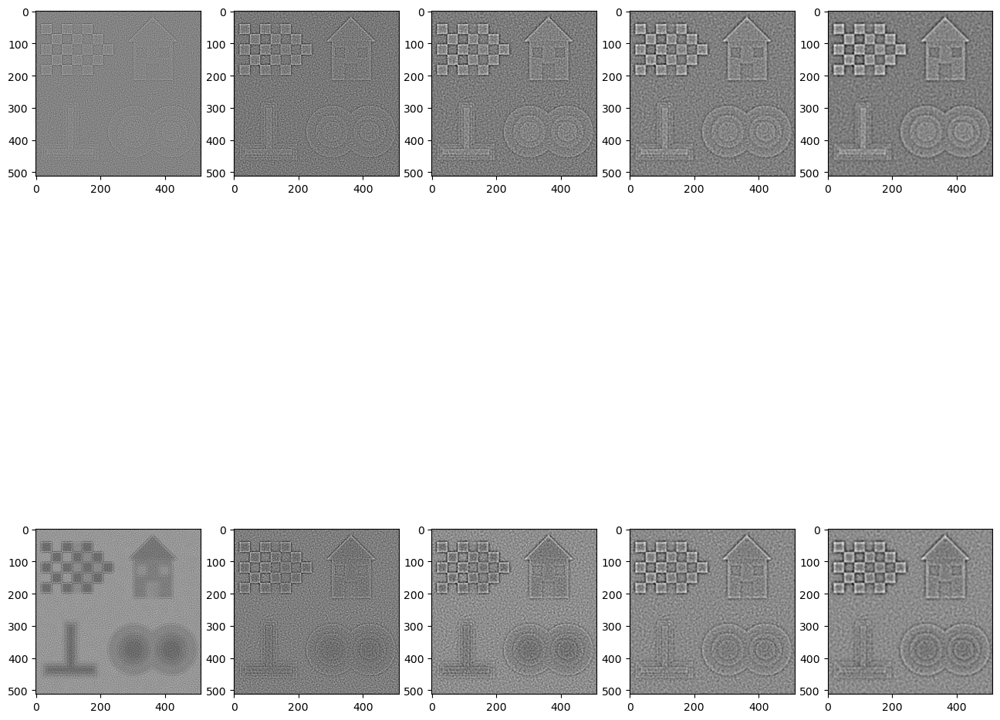

In [21]:
fig, axs = plt.subplots(nrows=2, ncols=5, figsize=(16, 16))
for i in range(2, 7):
    sigma = i * 0.5
    output1, output2, _ = filteredimg(i10, sigma)
    axs[0][i-2].imshow(output1, cmap='gray')
    axs[1][i-2].imshow(output2, cmap='gray')
plt.show()

In [22]:
kernel_B = np.array([ 
    [0,1,0],
    [1,1,1],
    [0,1,0]
], dtype=np.uint8)

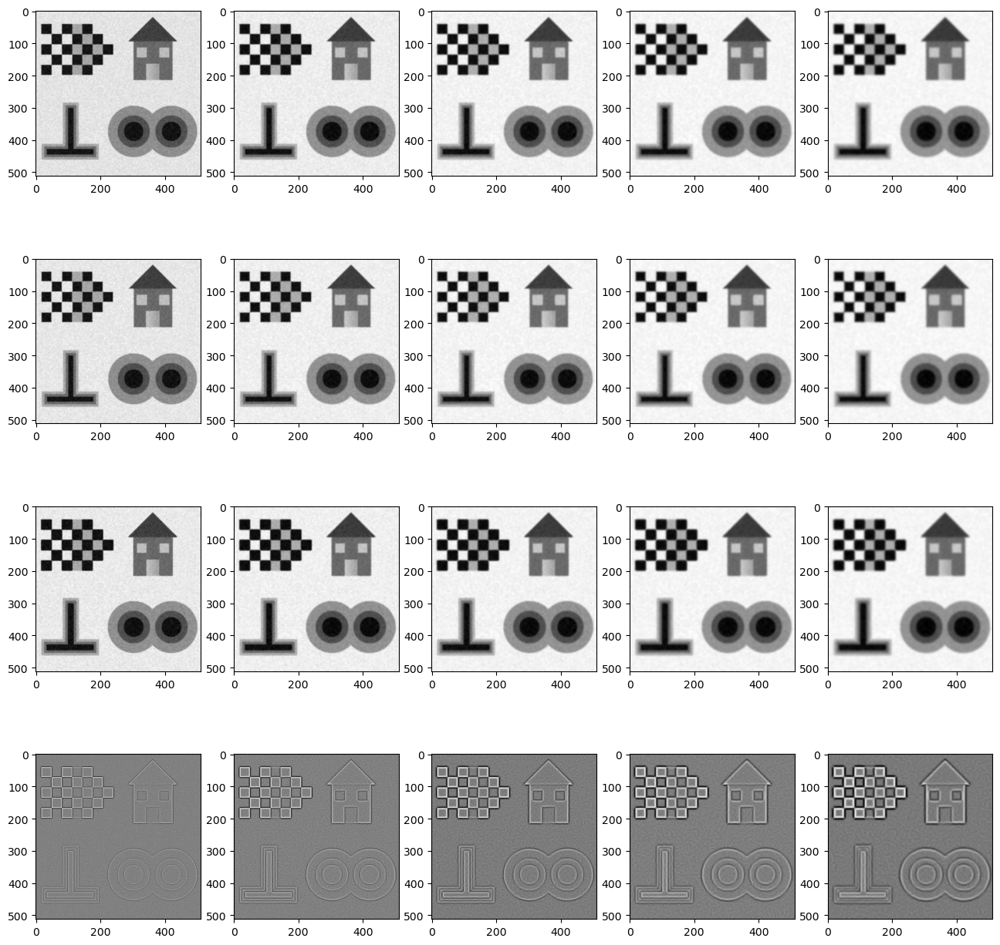

In [100]:
#non linear
fig, axs = plt.subplots(nrows=4, ncols=5, figsize=(16, 16))
for i in range(2, 7):
    sigma = i * 0.5
    _, _, output3 = filteredimg(i20, sigma)     #Isigma - smoothed img

    dilated = cv2.dilate(output3, kernel_B)

    eroded = cv2.erode(output3, kernel_B)

    L2 = dilated + eroded - 2*output3
    
    axs[0][i-2].imshow(output3, cmap='gray')    
    axs[1][i-2].imshow(dilated, cmap='gray')  
    axs[2][i-2].imshow(eroded, cmap='gray')  
    axs[3][i-2].imshow(L2, cmap='gray')  

plt.show()

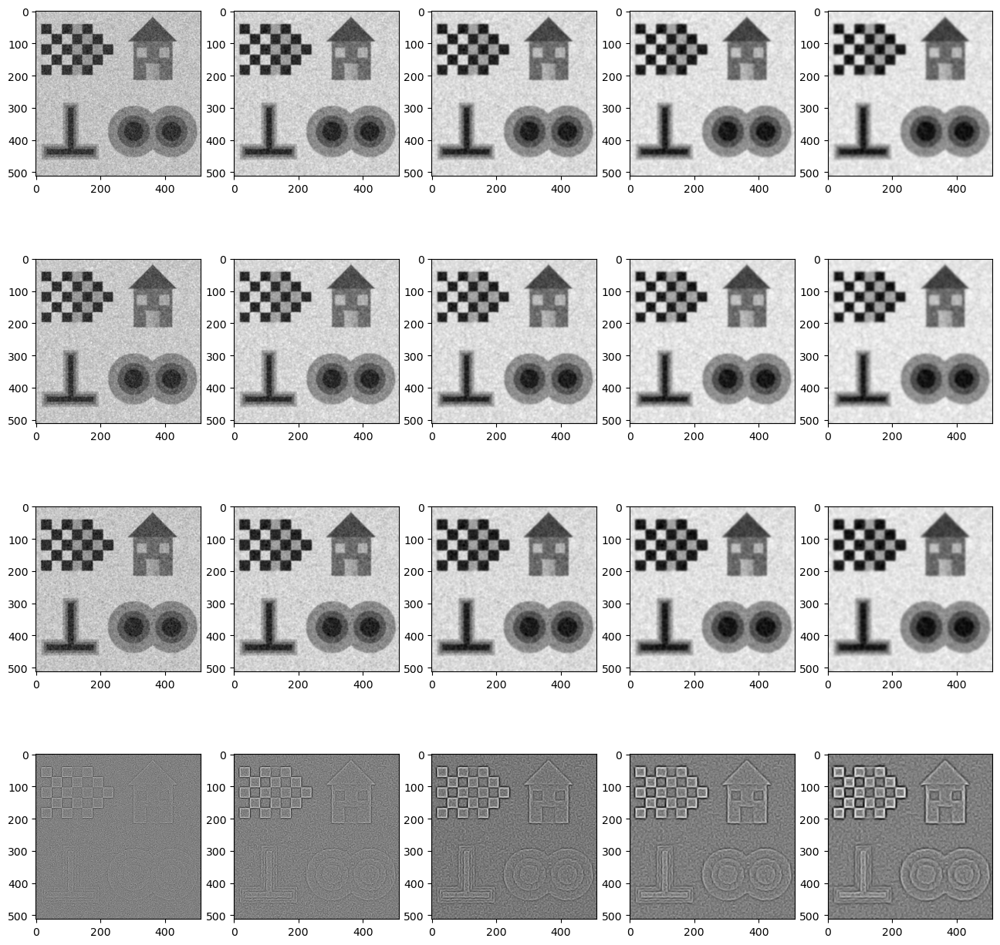

In [101]:
fig, axs = plt.subplots(nrows=4, ncols=5, figsize=(16, 16))
for i in range(2, 7):
    sigma = i * 0.5
    _, _, output3 = filteredimg(i10, sigma)

    dilated = cv2.dilate(output3, kernel_B)

    eroded = cv2.erode(output3, kernel_B)

    L2 = dilated + eroded - 2*output3
    
    axs[0][i-2].imshow(output3, cmap='gray')    
    axs[1][i-2].imshow(dilated, cmap='gray')  
    axs[2][i-2].imshow(eroded, cmap='gray')  
    axs[3][i-2].imshow(L2, cmap='gray')  

plt.show()

In [102]:
def not_lin_laplacian(img, sigma):
    _, _, output3 = filteredimg(img, sigma)

    dilated = cv2.dilate(output3, kernel_B)

    eroded = cv2.erode(output3, kernel_B)

    L2 = dilated + eroded - 2*output3

    return L2

In [103]:
def findzc(L, B):
    X = (L >= 0).astype(np.uint8) #create binary image
    Y = cv2.morphologyEx(X, cv2.MORPH_GRADIENT, B) #difference between dilation and erosion of an image
    return Y

In [104]:
#linear
L1_20, _, _ = filteredimg(i20, 2) 
L1_10, _, _ = filteredimg(i10, 2)

#not linear
L2_20 = not_lin_laplacian(i20, 2)
L2_10 = not_lin_laplacian(i10, 2)

In [105]:
a = findzc(L1_20, kernel_B)
b = findzc(L2_20, kernel_B)
c = findzc(L1_10, kernel_B)
d = findzc(L2_10, kernel_B)

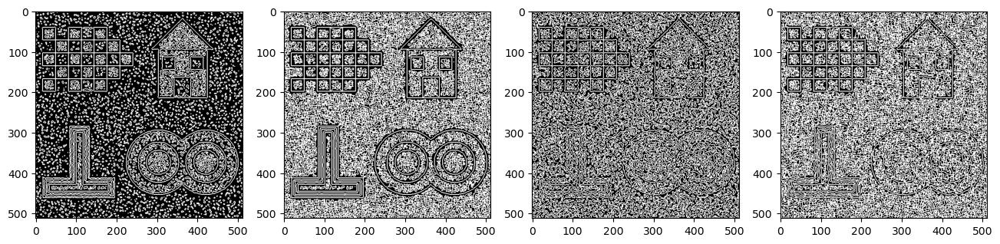

In [106]:
fig, axs = plt.subplots(ncols=4, figsize=(16, 16))
axs[0].imshow(a, cmap='gray')    
axs[1].imshow(b, cmap='gray')  
axs[2].imshow(c, cmap='gray')  
axs[3].imshow(d, cmap='gray') 

In [107]:
def reject_zerocrossings(Y, image, sigma, theta):
    _, _, imagegauss = filteredimg(image, sigma)
    grad_x, grad_y = np.gradient(imagegauss)
    grad_norm = np.sqrt(grad_x**2 + grad_y**2)
    max_grad_norm = np.max(grad_norm)
    edge_thresh = theta * max_grad_norm
    Z = np.zeros_like(Y)
    for i in range(Y.shape[0]):
        for j in range(Y.shape[1]):
            if Y[i, j] == 1 and grad_norm[i, j] > edge_thresh:
                Z[i, j] = 1
    
    return Z

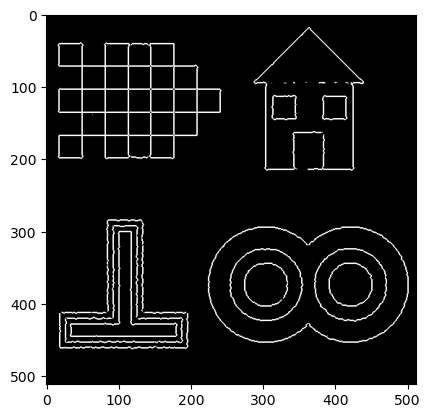

In [108]:
temp = reject_zerocrossings(a, i20, 2, 0.2)
plt.imshow(temp,cmap='gray')
plt.show()

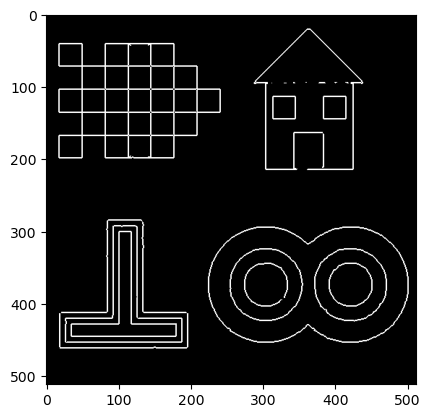

In [109]:
temp = reject_zerocrossings(b, i20, 2, 0.2)
plt.imshow(temp,cmap='gray')
plt.show()

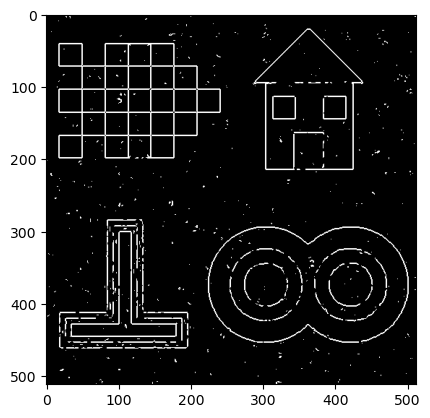

In [110]:
temp = reject_zerocrossings(b, i10, 2, 0.2)
plt.imshow(temp,cmap='gray')
plt.show()

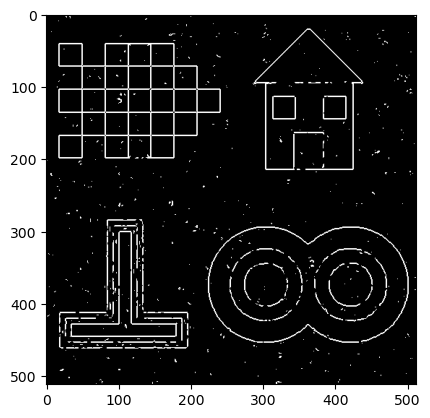

In [111]:
temp = reject_zerocrossings(b, i10, 2, 0.2)
plt.imshow(temp,cmap='gray')
plt.show()

In [112]:
def EdgeDetect(image, sigma, theta, mode):
    n = int(np.ceil(3*sigma)*2+1)

    k = cv2.getGaussianKernel(n, sigma) 
    gaussiankernel = k @ k.T
    gaussiankernel /= np.sum(gaussiankernel)

    
    smoothed = cv2.filter2D(image, -1, gaussiankernel)

    kernel_B = np.array([ 
        [0,1,0],
        [1,1,1],
        [0,1,0]
        ], dtype=np.uint8)

    if (mode == "linear"):
        lin = np.linspace(-n//2+1, n//2, n)
        x, y = np.meshgrid(lin, lin)
        logkernel = -(1/(np.pi*sigma**4)) * (1 - ((x**2 + y**2)/(2*sigma**2))) * np.exp(-(x**2 + y**2)/(2*sigma**2))
        logkernel /= np.sum(np.abs(logkernel))

        L = cv2.filter2D(smoothed, -1, logkernel)
        

    elif (mode == "non-linear"):
        dilated = cv2.dilate(smoothed, kernel_B)
        eroded = cv2.erode(smoothed, kernel_B)
        L = dilated + eroded - 2*smoothed
    

    else:
        raise ValueError("last argument must be 'linear' or 'non-linear'")

    X = (L>=0).astype(np.uint8)
    Y = cv2.morphologyEx(X, cv2.MORPH_GRADIENT, kernel_B)

    grad_x, grad_y = np.gradient(smoothed)
    grad_norm = np.sqrt(grad_x**2 + grad_y**2)
    max_grad_norm = np.max(grad_norm)
    edge_thresh = theta * max_grad_norm

    Z = (grad_norm > edge_thresh).astype(np.uint8)
    
    return Z&Y
    

    


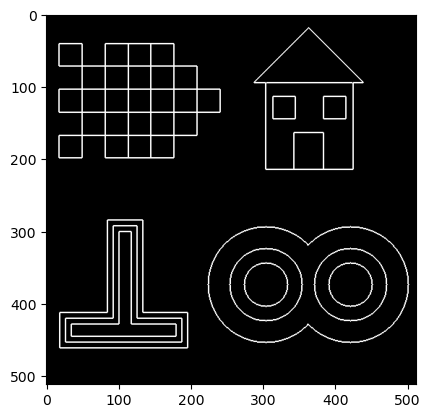

In [113]:
D = EdgeDetect(i0, 0.1, 0.1, 'non-linear')
plt.imshow(D, cmap='gray')
plt.show()

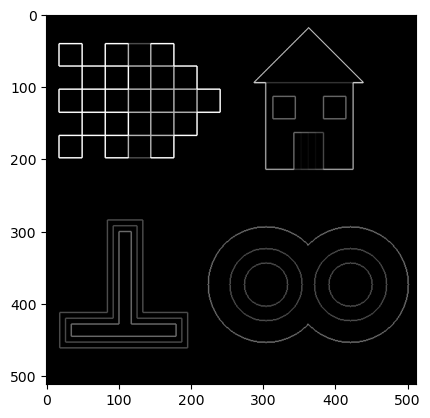

In [114]:
#1.3
M = cv2.dilate(i0, kernel_B) - cv2.erode(i0, kernel_B)
plt.imshow(M, cmap='gray')
plt.show()

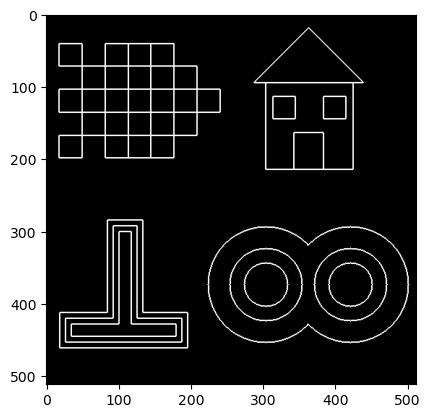

In [115]:
theta2=0.1
T = (M>theta2).astype(np.uint8)
plt.imshow(T,cmap='gray')
plt.show()

In [116]:
def score(T, D):
    intersection = np.logical_and(T, D)
    precision = np.sum(intersection) / np.sum(D)
    recall = np.sum(intersection) / np.sum(T)

    # Calculate the quality criterion C
    C = (precision + recall) / 2
    return C, precision, recall

C, precision, recall = score(T, D)
print('Precision:', precision)
print('Recall:', recall)
print('Quality criterion C:', C)

Precision: 1.0
Recall: 0.9998483929654336
Quality criterion C: 0.9999241964827168


In [117]:

modes = ['linear', 'non-linear']
sigmas = [0.3, 0.5, 0.8, 1, 1.2, 1.5, 1.8, 2, 2.2, 2.5, 2.8, 3]
thetas = [0.1, 0.12, 0.15, 0.18, 0.2, 0.22, 0.25]
temp2 = 0
for mode in modes:
    for sigma in sigmas:
        for theta in thetas:
            temp1 = EdgeDetect(i20, sigma, theta, mode)
            if (score(T, temp1)[0] > temp2):
                img20_1 = temp1
                temp2, _, _ = score(T, temp1)
                best_s = sigma
                best_theta = theta
                best_mode = mode 

print("Best results for PSNR = 20dB:\nScore:", temp2, "\nSigma:", best_s, "\nTheta:", best_theta,"\nMode:",best_mode)


Best results for PSNR = 20dB:
Score: 0.9695340338411182 
Sigma: 1.5 
Theta: 0.15 
Mode: non-linear


In [118]:
#PSNR = 20dB
modes = ['non-linear']
sigmas = [0.3, 0.5, 0.8, 1, 1.2, 1.5, 1.8, 2, 2.2, 2.5, 2.8, 3]
thetas = [0.1, 0.12, 0.15, 0.18, 0.2, 0.22, 0.25]
temp2 = 0
for mode in modes:
    for sigma in sigmas:
        for theta in thetas:
            temp1 = EdgeDetect(i20, sigma, theta, mode)
            if (score(T, temp1)[0] > temp2):
                img20_1 = temp1
                temp2, _, _ = score(T, temp1)
                best_s = sigma
                best_theta = theta
                best_mode = mode 

print("Best results for PSNR = 20dB:\nScore:", temp2, "\nSigma:", best_s, "\nTheta:", best_theta,"\nMode:",best_mode)



Best results for PSNR = 20dB:
Score: 0.9695340338411182 
Sigma: 1.5 
Theta: 0.15 
Mode: non-linear


In [119]:
modes = ['non-linear']
sigmas = [0.3, 0.5, 0.8, 1, 1.2, 1.5, 1.8, 2, 2.2, 2.5, 2.8, 3]
thetas = [0.1, 0.12, 0.15, 0.18, 0.2, 0.22, 0.25]
temp2 = 0
for mode in modes:
    for sigma in sigmas:
        for theta in thetas:
            temp1 = EdgeDetect(i10, sigma, theta, mode)
            if (score(T, temp1)[0] > temp2):
                img10_1 = temp1
                temp2, _, _ = score(T, temp1)
                best_s = sigma
                best_theta = theta
                best_mode = mode 

print("Best results for PSNR = 10dB:\nScore:", temp2, "\nSigma:", best_s, "\nTheta:", best_theta,"\nMode:",best_mode)



Best results for PSNR = 10dB:
Score: 0.7796473376102946 
Sigma: 2.5 
Theta: 0.22 
Mode: non-linear


In [120]:
#check for linear - 20dB

modes = ['linear']
sigmas = [0.3, 0.5, 0.8, 1, 1.2, 1.5, 1.8, 2, 2.2, 2.5, 2.8, 3]
thetas = [0.1, 0.12, 0.15, 0.18, 0.2, 0.22, 0.25]
temp2 = 0
for mode in modes:
    for sigma in sigmas:
        for theta in thetas:
            temp1 = EdgeDetect(i20, sigma, theta, mode)
            if (score(T, temp1)[0] > temp2):
                img20_2 = temp1
                temp2, _, _ = score(T, temp1)
                best_s = sigma
                best_theta = theta
                best_mode = mode 

print("Best results for PSNR = 20dB:\nScore:", temp2, "\nSigma:", best_s, "\nTheta:", best_theta,"\nMode:",best_mode)



Best results for PSNR = 20dB:
Score: 0.9448762584949029 
Sigma: 1 
Theta: 0.18 
Mode: linear


In [121]:
#check for linear - 20dB
modes = ['linear']
sigmas = [0.3, 0.5, 0.8, 1, 1.2, 1.5, 1.8, 2, 2.2, 2.5, 2.8, 3]
thetas = [0.1, 0.12, 0.15, 0.18, 0.2, 0.22, 0.25]
temp2 = 0
for mode in modes:
    for sigma in sigmas:
        for theta in thetas:
            temp1 = EdgeDetect(i10, sigma, theta, mode)
            if (score(T, temp1)[0] > temp2):
                img10_2 = temp1
                temp2, _, _ = score(T, temp1)
                best_s = sigma
                best_theta = theta
                best_mode = mode 

print("Best results for PSNR = 10dB:\nScore:", temp2, "\nSigma:", best_s, "\nTheta:", best_theta,"\nMode:",best_mode)


Best results for PSNR = 10dB:
Score: 0.6877615039820889 
Sigma: 1.8 
Theta: 0.25 
Mode: linear


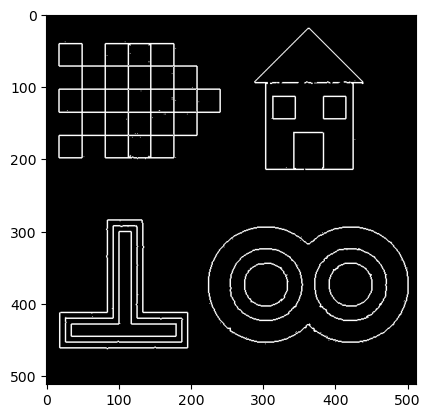

In [122]:
plt.imshow(img20_1, cmap='gray')

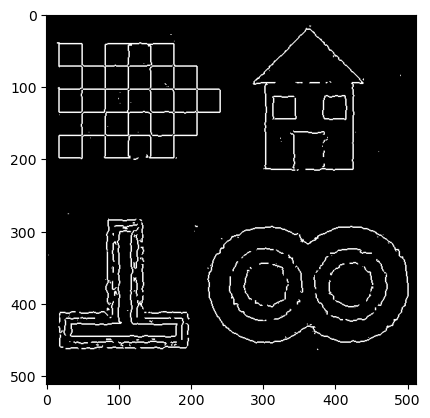

In [123]:
plt.imshow(img10_1, cmap='gray')

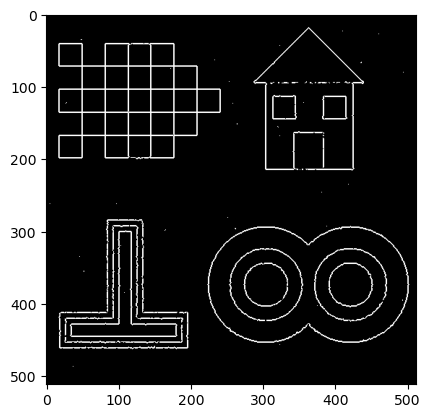

In [124]:
plt.imshow(img20_2, cmap='gray')

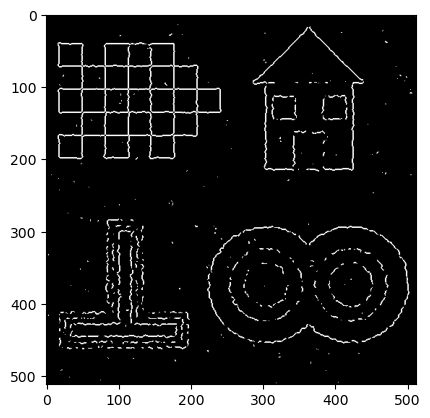

In [125]:
plt.imshow(img10_2, cmap='gray')

In [186]:
#1.4
img1 = cv2.imread('kyoto_edges.jpg', cv2.IMREAD_GRAYSCALE)

print("Resolution: ", img1.shape)
print("Range: %d - %d " % (img1.min(), img1.max()))

Resolution:  (534, 800)
Range: 0 - 255 


In [127]:
kyoto = img1.astype(float)/255

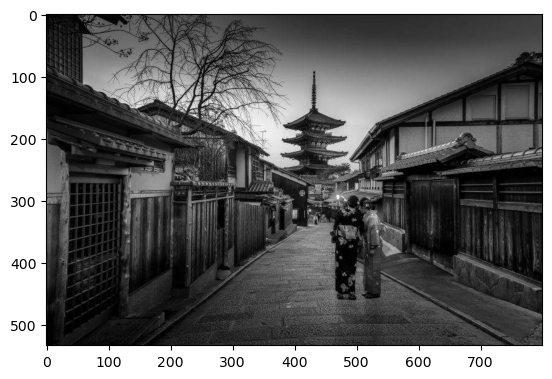

In [128]:
plt.imshow(kyoto, cmap='gray')

Text(0.5, 1.0, 'sigma = 2, theta = 0.2, mode = linear')

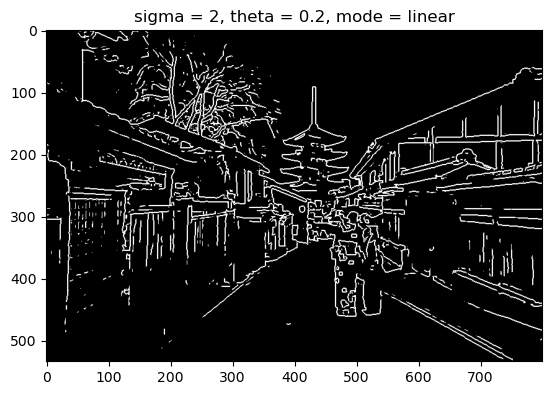

In [129]:
kyoto_edges = EdgeDetect(kyoto, 2, 0.2, "non-linear")
plt.imshow(kyoto_edges, cmap='gray')
plt.title("sigma = 2, theta = 0.2, mode = linear")

In [130]:
"""
modes = ['linear', 'non-linear']
sigmas = [0.3, 0.5, 0.8, 1, 1.2, 1.5, 1.8, 2, 2.2, 2.5, 2.8, 3]
thetas = [0.1, 0.12, 0.15, 0.18, 0.2, 0.22, 0.25, 0.28, 3]
i = 0
for mode in modes:
    for sigma in sigmas:
        for theta in thetas:
            output_img = EdgeDetect(kyoto, sigma, theta, mode)
            plt.imshow(output_img, cmap='gray')
            plt.title(f'Output Image {i+1}')
            print("\nSigma:",sigma, "\nTheta:", theta, "\nMode:", mode, '\n')
            i+= 1
            plt.show()
            
"""

'\nmodes = [\'linear\', \'non-linear\']\nsigmas = [0.3, 0.5, 0.8, 1, 1.2, 1.5, 1.8, 2, 2.2, 2.5, 2.8, 3]\nthetas = [0.1, 0.12, 0.15, 0.18, 0.2, 0.22, 0.25, 0.28, 3]\ni = 0\nfor mode in modes:\n    for sigma in sigmas:\n        for theta in thetas:\n            output_img = EdgeDetect(kyoto, sigma, theta, mode)\n            plt.imshow(output_img, cmap=\'gray\')\n            plt.title(f\'Output Image {i+1}\')\n            print("\nSigma:",sigma, "\nTheta:", theta, "\nMode:", mode, \'\n\')\n            i+= 1\n            plt.show()\n            \n'

Text(0.5, 1.0, 'sigma = 1, theta = 0.12, mode = linear')

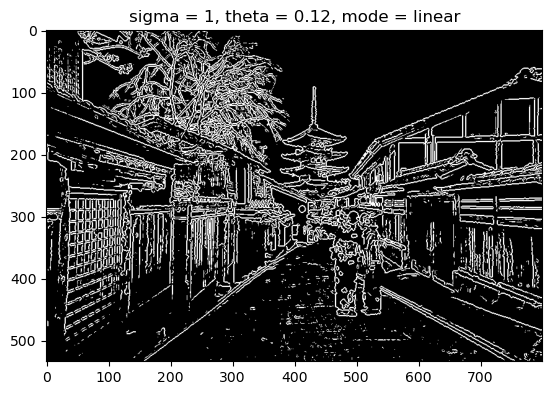

In [131]:
output_img = EdgeDetect(kyoto, 1 , 0.12, 'linear')
plt.imshow(output_img, cmap='gray')
plt.title("sigma = 1, theta = 0.12, mode = linear")

Text(0.5, 1.0, 'sigma = 0.5, theta = 0.12, mode = linear')

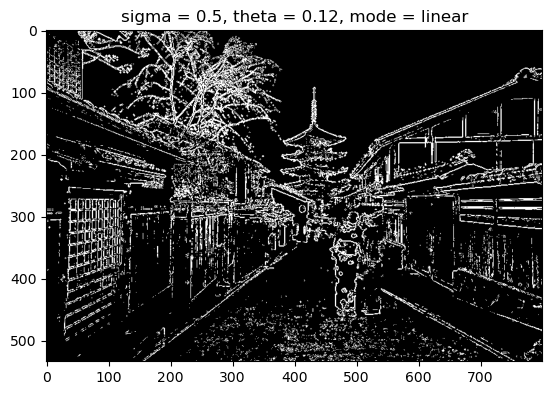

In [132]:
output_img = EdgeDetect(kyoto, 0.5 , 0.12, 'linear')
plt.imshow(output_img, cmap='gray')
plt.title("sigma = 0.5, theta = 0.12, mode = linear")

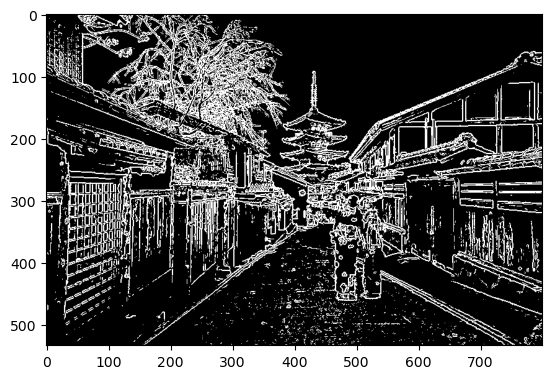

In [133]:
output_img = EdgeDetect(kyoto, 0.8 , 0.12, 'non-linear')
plt.imshow(output_img, cmap='gray')


Text(0.5, 1.0, 'sigma = 1.4, theta = 0.18, mode = non-linear')

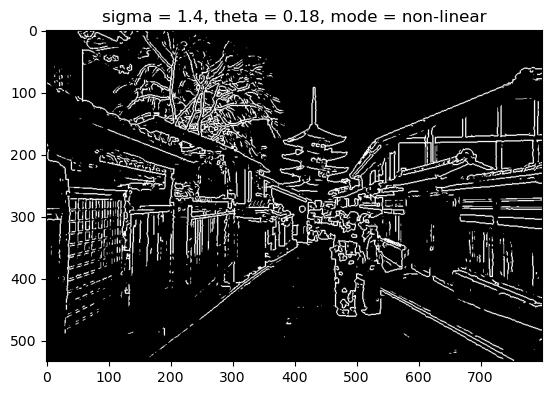

In [134]:
output_img = EdgeDetect(kyoto, 1.4 , 0.18, 'non-linear')
plt.imshow(output_img, cmap='gray')
plt.title("sigma = 1.4, theta = 0.18, mode = non-linear")

In [187]:
#Second part
import sys
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Circle

def interest_points_visualization(I_, kp_data_, ax=None):
    '''
    Plot keypoints chosen by detectos on image.
    Args:
        I_: Image (if colored, make sure it is in RGB and not BGR).
        kp_data_: Nx3 array, as described in assignment.
        ax: Matplotlib axis to plot on (if None, a new Axes object is created).
    Returns:
        ax: Matplotlib axis where the image was plotted.
    '''
    try:
        I = np.array(I_)
        kp_data = np.array(kp_data_)
    except:
        print('Conversion to numpy arrays failed, check if the inputs (image and keypoints) are in the required format.')
        exit(2)

    try:
        assert(len(I.shape) == 2 or (len(I.shape) == 3 and I.shape[2] == 3))
    except AssertionError as e:
        print('interest_points_visualization: Image must be either a 2D matrix or a 3D matrix with the last dimension having size equal to 3.', file=sys.stderr)
        exit(2)

    try:
        assert(len(kp_data.shape) == 2 and kp_data.shape[1] == 3)
    except AssertionError as e:
        print('interest_points_visualization: kp_data must be a 2D matrix with 3 columns.', file=sys.stderr)
        exit(2)

    if ax is None:
        _, ax = plt.subplots()

    ax.set_aspect('equal')
    ax.imshow(I)
    ax.tick_params(bottom=False, left=False, labelbottom=False, labelleft=False)

    for i in range(len(kp_data)):
        x, y, sigma = kp_data[i]
        circ = Circle((x, y), 3*sigma, edgecolor='g', fill=False, linewidth=1)
        ax.add_patch(circ)

    return ax

def disk_strel(n):
    '''
        Return a structural element, which is a disk of radius n.
    '''
    r = int(np.round(n))
    d = 2*r+1
    x = np.arange(d) - r
    y = np.arange(d) - r
    x, y = np.meshgrid(x,y)
    strel = x**2 + y**2 <= r**2
    return strel.astype(np.uint8)

In [188]:
#2.1

def compute_structure_tensor(img, rho, sigma):
    img = img.astype(float)/255
    
    Gs = GaussKernel(sigma)
    Gp = GaussKernel(rho)

    Is = cv2.filter2D(img, -1, Gs)

    dx, dy = np.gradient(Is)

    J1 = cv2.filter2D(dx*dx, -1, Gp)
    J2 = cv2.filter2D(dx*dy, -1, Gp)
    J3 = cv2.filter2D(dy*dy, -1, Gp)

    return J1, J2, J3

In [189]:
J1, J2, J3 = compute_structure_tensor(img1, 2, 2)

In [190]:
def compute_eigenvalues(J1, J2, J3):
    lambda1 = 0.5 * (J1 + J3 + np.sqrt((J1 - J3)**2 + 4*J2**2))
    lambda2 = 0.5 * (J1 + J3 - np.sqrt((J1 - J3)**2 + 4*J2**2))
    return lambda1, lambda2

In [191]:
l1, l2 = compute_eigenvalues(J1, J2, J3)

Text(0.5, 1.0, 'λ+')

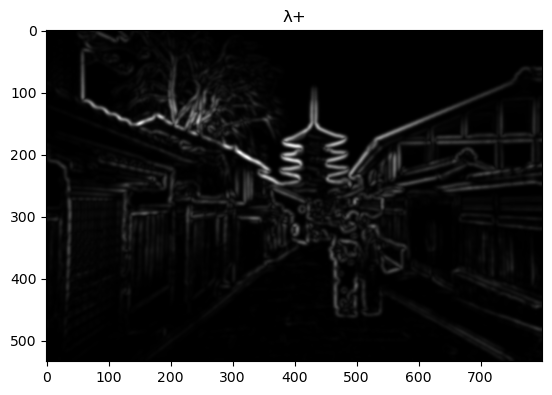

In [192]:
plt.imshow(l1, cmap='gray')
plt.title("λ+")

Text(0.5, 1.0, 'λ-')

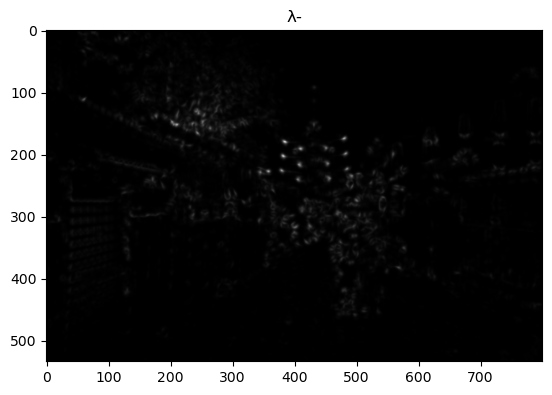

In [193]:
plt.imshow(l2, cmap='gray')
plt.title("λ-")

In [194]:
def R(l1, l2, k):
    return l1*l2 - k*((l1+l2)**2)

In [195]:
def choosepixels(R, sigma, theta_corn):
    ns = np.ceil(3*sigma)*2+1
    B_sq = disk_strel(ns)
    Cond1 = ( R==cv2.dilate(R,B_sq) )
    Cond2 = ( (R > theta_corn*np.amax(R)))
    corners = 1*(Cond1*Cond2)
    return corners

In [196]:
R = R(l1, l2, 0.05)
corn = choosepixels(R, 2, 0.01)

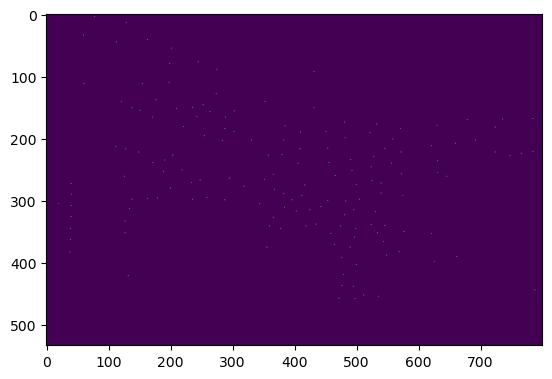

In [197]:
plt.imshow(corn)

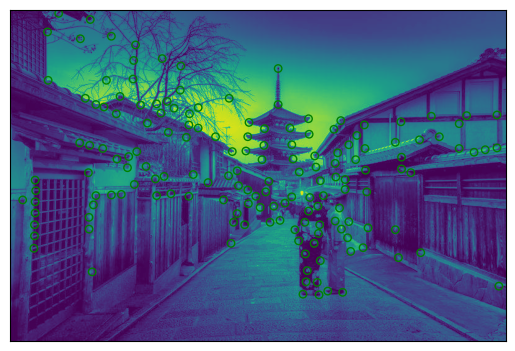

In [198]:
poi = np.nonzero(corn == 1)                 #find the coords of all elements==1
aa = []
for i in range(np.sum(corn)):
    aa.append([poi[1][i], poi[0][i], 2])

vis = interest_points_visualization(img1, aa)

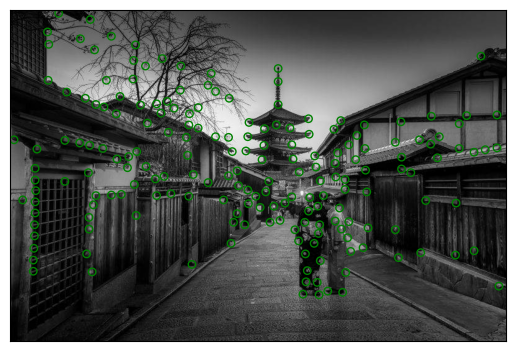

In [147]:
img1 = cv2.cvtColor(img1, cv2.COLOR_GRAY2RGB)
img =  cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
vis = interest_points_visualization(img, aa)

In [199]:
def corner_detection(img_colour, img, sigma, rho, k, theta_corn):
    I = img.astype(float)/255
    
    Gs = GaussKernel(sigma)
    Gp = GaussKernel(rho)

    Is = cv2.filter2D(I, -1, Gs)

    dx, dy = np.gradient(Is)

    J1 = cv2.filter2D(dx*dx, -1, Gp)
    J2 = cv2.filter2D(dx*dy, -1, Gp)
    J3 = cv2.filter2D(dy*dy, -1, Gp)

    l1 = 0.5*(J1 + J3 + np.sqrt((J1 - J3)**2 + 4*J2**2))
    l2 = 0.5*(J1 + J3 - np.sqrt((J1 - J3)**2 + 4*J2**2))

    R = l1 * l2 - k*((l1 + l2)**2)
    
    ns = np.ceil(3*sigma)*2+1                             
    B_sq = disk_strel(ns)
    Cond1 = ( R==cv2.dilate(R,B_sq) )
    Cond2 = (R > theta_corn * np.amax(R))
    corners = (Cond1&Cond2).astype(np.uint8)

    poi = np.nonzero(corners == 1)                 #find the coords of all elements==1
    aa = []
    for i in range(np.sum(corners)):
            aa.append([poi[1][i], poi[0][i], sigma])

    col_img = cv2.cvtColor(img_colour, cv2.COLOR_BGR2RGB)
    interest_points_visualization(col_img, aa)
    return corners 

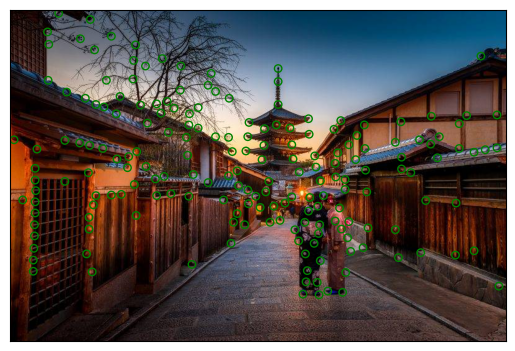

In [200]:
ky_bgr = cv2.imread('kyoto_edges.jpg')
ky_gray = cv2.imread('kyoto_edges.jpg', cv2.IMREAD_GRAYSCALE)
ky = corner_detection(ky_bgr, ky_gray, 2, 2, 0.05, 0.005)

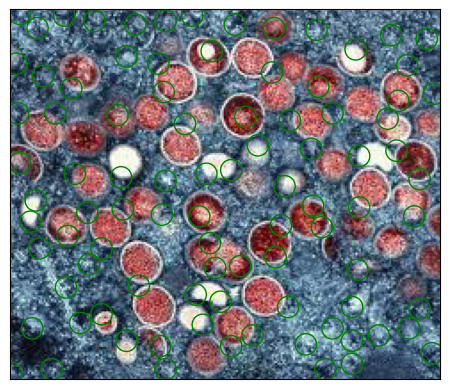

In [201]:
cells_bgr = cv2.imread('cells.jpg')
cells_gray = cv2.imread('cells.jpg', cv2.IMREAD_GRAYSCALE)
#plt.imshow(cells_gray, cmap='gray')
test1 = corner_detection(cells_bgr, cells_gray, 1.5, 2, 0.05, 0.01)

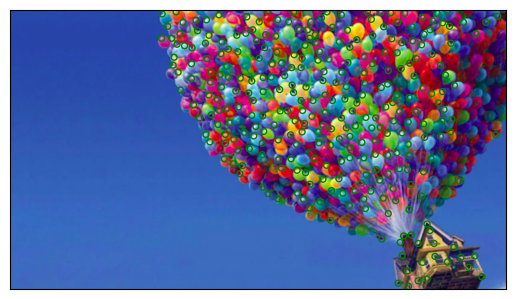

In [202]:
up_bgr = cv2.imread('up.png')
up_gray = cv2.imread('up.png', cv2.IMREAD_GRAYSCALE)
#plt.imshow(up_gray, cmap='gray')
test2 = corner_detection(up_bgr, up_gray, 2, 2, 0.05, 0.01)

In [208]:
#2.2
def corn_dect_wr(I, s=2, p0=2.5, k=0.01, theta_corn=0.03):
    img = I.astype(float)/255
    n1 = int(np.ceil(3*s)*2+1)
    #n = int(n)
    
    gaussian1 = cv2.getGaussianKernel(n1,s) 
    Gs = gaussian1 @ gaussian1.T
    
    Is = cv2.filter2D(img, -1, Gs)
    
    n2 = int(np.ceil(3*p0)*2+1)
    gaussian2 = cv2.getGaussianKernel(n2, p0) 
    Gp = gaussian2 @ gaussian2.T


    dx, dy = np.gradient(Is)

    J1 = cv2.filter2D(dx*dx, -1, Gp)
    J2 = cv2.filter2D(dx*dy, -1, Gp)
    J3 = cv2.filter2D(dy*dy, -1, Gp)

    l1 = 0.5*(J1 + J3 + np.sqrt((J1 - J3)**2 + 4*J2**2))
    l2 = 0.5*(J1 + J3 - np.sqrt((J1 - J3)**2 + 4*J2**2))

    R = l1 * l2 - k*((l1 + l2)**2)
    
    ns = np.ceil(3*s)*2+1                             
    B_sq = disk_strel(ns)
    Cond1 = ( R==cv2.dilate(R,B_sq) )
    Cond2 = (R > theta_corn * np.amax(R))
    x,y = np.where(Cond1 & Cond2)
    
    return list(zip(x,y))

def Harris_Laplacian(img_colour, img, N = 4, sigma0 = 2, rho0 = 2.5, s = 2, k= 0.05 , theta_corn = 0.03):
    I = img
    sigma = np.array(sigma0*s**np.arange(N))
    rho = np.array(rho0*s**np.arange(N))
    corners = [corn_dect_wr(I, sigma[i], rho[i], k, theta_corn) for i in range(N)]
    L = np.empty(np.expand_dims(I, axis=0).shape,dtype=object)
    for sigmas in sigma:
        Is = cv2.filter2D(I, -1, GaussKernel(sigmas))
        Lxx = np.gradient(np.gradient(Is, axis=0), axis=0)
        Lyy = np.gradient(np.gradient(Is, axis=1), axis=1)
        L = np.append(L, [sigmas**2 * abs(Lxx + Lyy)], axis=0)   

    L = L[1:]
    for sigmas in range(N-1):
        scale1 = corners[sigmas]
        scale2 = corners[sigmas+1]
        intersect = set(scale1) & set(scale2)
        if intersect:
            for corner in intersect:
                if L[sigmas][corner] < L[sigmas+1][corner]:
                    corners[sigmas].remove(corner)
    corners = np.array([(y, x, sigma[index]) for index, c in enumerate(corners) for x, y in c])
    temp = cv2.cvtColor(img_colour, cv2.COLOR_BGR2RGB)
    interest_points_visualization(temp, corners)
    return corners

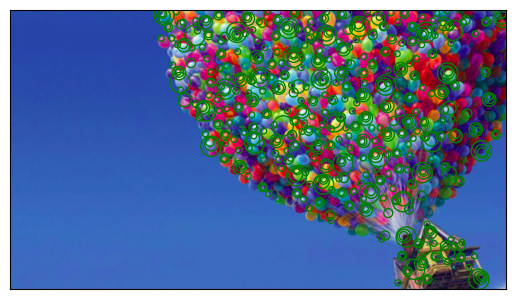

In [209]:
upgray= cv2.imread('up.png', cv2.IMREAD_GRAYSCALE)
up = cv2.imread('up.png')
test3 = Harris_Laplacian(up, upgray, 4, 2, 2, 1.5, 0.01, 0.01)

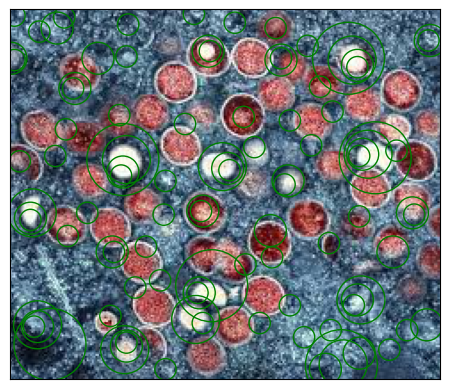

In [211]:
cellsgray= cv2.imread('cells.jpg', cv2.IMREAD_GRAYSCALE)
cells = cv2.imread('cells.jpg')
test3 = Harris_Laplacian(cells, cellsgray, 4, 2, 2.5, 1.5, 0.05, 0.01)

In [155]:
#2.3
def Hessian_det(img, sigma):
    I = img.astype(float)/255
    Is= cv2.filter2D(I, -1, GaussKernel(sigma))
    dx, dy = np.gradient(Is)
    Lxx, Lxy = np.gradient(dx)
    _, Lyy = np.gradient(dy)
    return Lxx*Lyy - Lxy*Lxy


<AxesSubplot:>

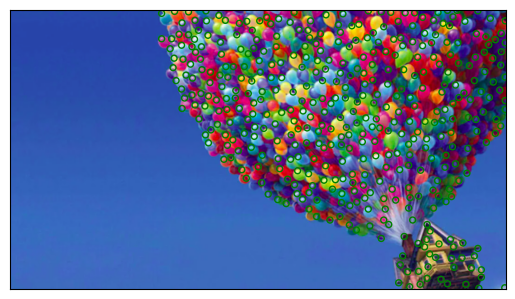

In [156]:
sigma = 2
theta_corn = 0.05
R = Hessian_det(up_gray, sigma)
ns = np.ceil(3*sigma)*2+1  
thete_corn = 0.05       

B_sq = disk_strel(ns)
Cond1 = ( R==cv2.dilate(R,B_sq) )
Cond2 = (R > theta_corn*np.amax(R))
corners = (Cond1*Cond2).astype(np.uint8)

poi = np.nonzero(corners == 1)                  
kp_data = []
for i in range(np.sum(corners)):
    kp_data.append([poi[1][i],poi[0][i],sigma]) 

col_img = cv2.cvtColor(up, cv2.COLOR_BGR2RGB)
interest_points_visualization(col_img, kp_data)

In [157]:
#2.3
img = up_gray
I = img.astype(float)/255
Is= cv2.filter2D(I, -1, GaussKernel(sigma))
dx, dy = np.gradient(Is)
Lxx, Lxy = np.gradient(dx)
_, Lyy = np.gradient(dy)
R = Hessian_det(up_gray, sigma)


In [212]:
def blob_detection(img_colour, img, sigma, theta_corn):
    I = img.astype(float)/255
    
    Is= cv2.filter2D(I, -1, GaussKernel(sigma))
    
    dx, dy = np.gradient(Is)
    Lxx, Lxy = np.gradient(dx)
    _, Lyy = np.gradient(dy)
    R = Lxx * Lyy - Lxy * Lxy
    
    ns = np.ceil(3*sigma)*2+1       
    B_sq = disk_strel(ns)
    Cond1 = ( R==cv2.dilate(R,B_sq) )
    Cond2 = (R > theta_corn*np.amax(R))
    corners = (Cond1*Cond2).astype(np.uint8)

    poi = np.nonzero(corners == 1)                  
    kp_data = []
    for i in range(np.sum(corners)):
        kp_data.append([poi[1][i],poi[0][i],sigma])  

    col_img = cv2.cvtColor(img_colour, cv2.COLOR_BGR2RGB)
    interest_points_visualization(col_img, kp_data)
    
    return corners

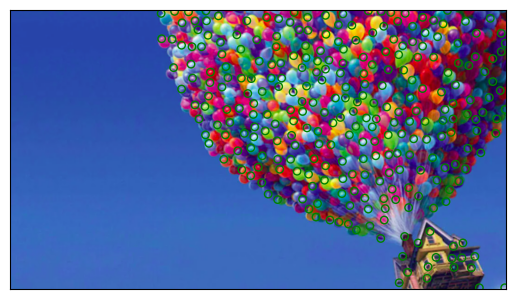

In [213]:
a = blob_detection(up, up_gray, 2.5, 0.01)

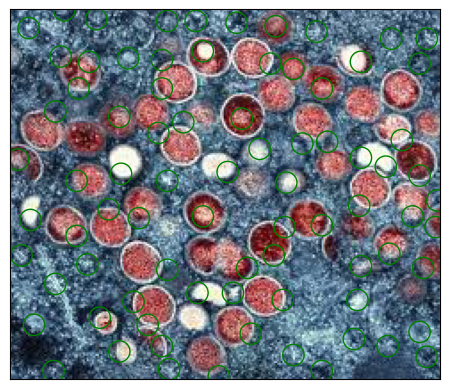

In [214]:
b = blob_detection(cells, cellsgray, 2, 0.01)

In [215]:
#2.4
def blob_detection_wrap( img, sigma=2, theta_corn=0.03):
    I = img.astype(float)/255
    
    Is = cv2.filter2D(I, -1, GaussKernel(sigma))
    Lxx = np.gradient(np.gradient(Is, axis=0), axis=0)
    Lyy = np.gradient(np.gradient(Is, axis=1), axis=1)
    Lxy = np.gradient(np.gradient(Is, axis=0), axis=1)
    R = Lxx * Lyy - Lxy * Lxy
    
    ns = np.ceil(3*sigma)*2+1       
    B_sq = disk_strel(ns)
    Cond1 = ( R==cv2.dilate(R,B_sq) )
    Cond2 = (R > theta_corn*np.amax(R))
    x,y = np.where(Cond1 & Cond2)
    
    return list(zip(x,y))

def blob_detection_scales(img_colour, img, N = 4, sigma0=2, s=2, theta_corn=0.03):
    if N < 1: return
    I = img
    sigma = np.array(sigma0*s**np.arange(N))
    corners = [blob_detection_wrap(I, sigma[i], theta_corn) for i in range(N)]

    L = np.empty(np.expand_dims(I, axis=0).shape,dtype=object)
    for sigmas in sigma:
        Is = cv2.filter2D(img, -1, GaussKernel(sigmas))
        Lxx = np.gradient(np.gradient(Is, axis=0), axis=0)
        Lyy = np.gradient(np.gradient(Is, axis=1), axis=1)
        L = np.append(L, [sigmas**2 * abs(Lxx + Lyy)], axis=0)
    L = L[1:]
    for sigmas in range(N-1):
        scale1 = corners[sigmas]
        scale2 = corners[sigmas+1]
        intersect = set(scale1) & set(scale2)
        if intersect:
            for corner in intersect:
                if L[sigmas][corner] < L[sigmas+1][corner]:
                    corners[sigmas].remove(corner)
    corners = np.array([(y, x, sigma[index]) for index, c in enumerate(corners) for x, y in c])
    col_img = cv2.cvtColor(img_colour, cv2.COLOR_BGR2RGB)
    interest_points_visualization(col_img, corners)

    return corners

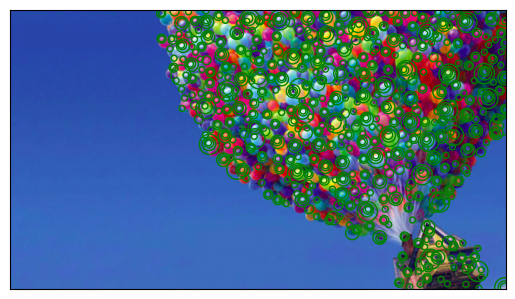

In [216]:
a = blob_detection_scales(up, up_gray, 4, 2, 1.5, 0.01)

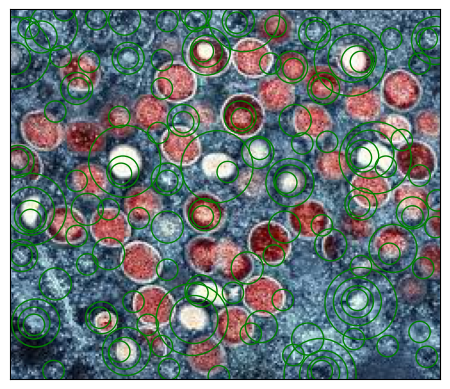

In [217]:
b = blob_detection_scales(cells, cellsgray, 4, 2, 1.5,0.01)

In [1]:
# Integral Image 
def integralImage(img):
    return np.array(img).cumsum(axis=0).cumsum(axis=1)


def plot(title, img):
    plt.imshow(img, cmap='gray')
    plt.axis('off')
    plt.title(title, fontweight ="bold")
    plt.show()


# Box Filters
def boxes(img,d1,d2):
    mx = int(max((d1-1)/2, (d2-1)/2)) +1
    integral = integralImage(np.pad(img, mx, mode='constant'))
    box = np.zeros_like(img, dtype=np.uint16)
    for i in range(np.shape(img)[0]):
        for j in range(np.shape(img)[1]):
             box[i][j] = (integral[i + int((d1-1)/2) + mx][j + int((d2-1)/2) + mx] + 
                         integral[i - int((d1-1)/2) -1+mx][j - int((d2-1)/2) -1+mx] - 
                         integral[i - int((d1-1)/2) -1+mx][j + int((d2-1)/2) + mx] - 
                         integral[i + int((d1-1)/2) + mx][j - int((d2-1)/2) -1+mx])
    return box

In [2]:
def BoxFilter(img, sigma, thetaC):
    n = 2*np.ceil(3*sigma) +1
    
    d1 = int(2*np.floor(n/6) +1)
    d2 = int(4*np.floor(n/6) +1)
    d1halved = int(np.ceil(d1/2))
    
    # Create Dxx, Dyy, Dxy
    Dxx = (-2*boxes(img, d1, d2) + 
          boxes(np.pad(img, ((0,0),(d1,0)), mode='constant')[:, :-d1], d1, d2) + 
          boxes(np.pad(img, ((0,0),(0,d1)), mode='constant')[:, d1:], d1, d2))
    Dyy = (-2*boxes(img, d2, d1) + 
          boxes(np.pad(img, ((d1,0),(0,0)), mode='constant')[:-d1, :], d2, d1) + 
          boxes(np.pad(img, ((0,d1),(0,0)), mode='constant')[d1:, :], d2, d1))
    Dxy = (boxes(np.pad(img, ((d1halved,0),(d1halved,0)), mode='constant')[:-d1halved, :-d1halved], d1, d1) + 
          boxes(np.pad(img, ((0,d1halved),(0,d1halved)), mode='constant')[d1halved:, d1halved:], d1, d1) - 
          boxes(np.pad(img, ((0,d1halved),(d1halved,0)), mode='constant')[d1halved:, :-d1halved], d1, d1) - 
          boxes(np.pad(img, ((d1halved,0),(0,d1halved)), mode='constant')[:-d1halved, d1halved:], d1, d1))
    
    # Exercise 2.5.3
    R = Dxx * Dyy - (0.9*Dxy)**2
    ns = np.ceil(3*sigma)*2+1
    B_sq = disk_strel(ns)
    Cond1 = (R == cv2.dilate(R,B_sq))
    Cond2 = (R > thetaC * np.max(R))
    x,y = np.where(Cond1 & Cond2)
    return list(zip(x,y))

<AxesSubplot:>

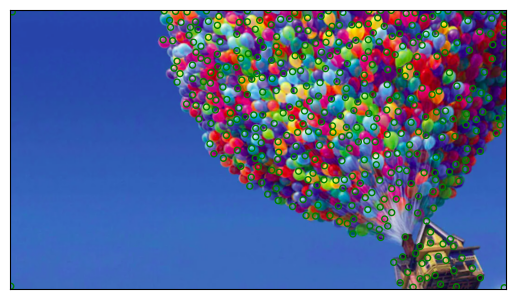

In [166]:
# Plot Box Filters
sigma = 2
up = cv2.imread('up.png') 
up = cv2.cvtColor(up, cv2.COLOR_RGB2BGR)
img = cv2.cvtColor(up, cv2.COLOR_RGB2GRAY)
boxFilter = BoxFilter(img, 2, 0.02)
box_plot = [(y, x, sigma) for x, y in boxFilter]
interest_points_visualization(up, box_plot)

<AxesSubplot:>

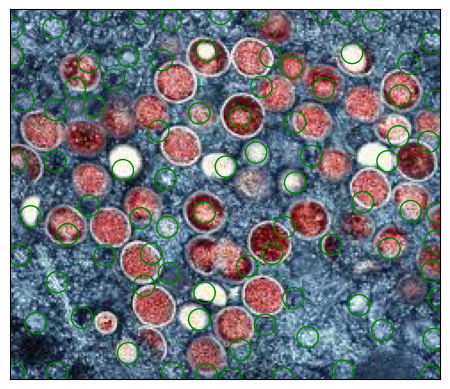

In [251]:
sigma = 2
cells = cv2.imread('cells.jpg') 
cells = cv2.cvtColor(cells, cv2.COLOR_RGB2BGR)
img = cv2.cvtColor(cells, cv2.COLOR_RGB2GRAY)
boxFilter = BoxFilter(img, 2, 0.02)
box_plot = [(y, x, sigma) for x, y in boxFilter]
interest_points_visualization(cells, box_plot)

In [253]:
def BoxFilter_scales(I, sigma0, theta_corn, s, N):
    if N < 1: 
        raise Exception("N > 1")
    
    sigma = np.array(sigma0*s**np.arange(N))
    corners = [BoxFilter(I, sigmas, theta_corn) for sigmas in sigma]
    
    normLoG = np.empty(np.expand_dims(I, axis=0).shape,dtype=object)
    for sigmas in sigma:
        Is = cv2.filter2D(I, -1, GaussKernel(sigmas))
        Lxx = np.gradient(np.gradient(Is, axis=0), axis=0)
        Lyy = np.gradient(np.gradient(Is, axis=1), axis=1)
        normLoG = np.append(normLoG, [sigmas**2 * abs(Lxx + Lyy)], axis=0)
    normLoG = normLoG[1:]
    for sigmas in range(N-1):
        scale1 = corners[sigmas]
        scale2 = corners[sigmas+1]
        intersect = set(scale1) & set(scale2)
        if intersect:
            for corner in intersect:
                if normLoG[sigmas][corner] < normLoG[sigmas+1][corner]:
                    corners[sigmas].remove(corner)
    corners = np.array([(y, x, sigma[index]) for index, c in enumerate(corners) for x, y in c])
    return corners

<AxesSubplot:>

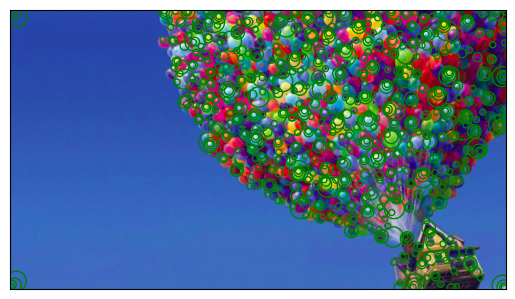

In [168]:
multiBox = BoxFilter_scales(img,2,0.02,1.5,4)
interest_points_visualization(up, multiBox)

<AxesSubplot:>

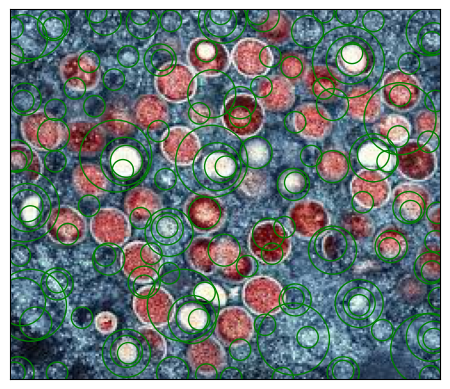

In [254]:
multiBox = BoxFilter_scales(img,2,0.02,1.5,4)
interest_points_visualization(cells, multiBox)

In [ ]:
# Plot Box Filters
sigma = 2
colored = cv2.imread('cells.png') 
colored = cv2.cvtColor(colored, cv2.COLOR_RGB2BGR)
img = cv2.cvtColor(colored, cv2.COLOR_RGB2GRAY)
boxFilter = BoxFilter(img, 2, 0.02)
box_plot = [(y, x, sigma) for x, y in boxFilter]
interest_points_visualization(colored, box_plot)
multiBox = BoxFilter_scales(img,2,0.02,1.5,4)
interest_points_visualization(up, multiBox)

In [232]:
# part 3
from sklearnex import patch_sklearn
patch_sklearn()
import cv23_lab1_part3_utils as lab


def corner_detection2(I, s=2, p0=2.5, k=0.01, theta_corn=0.01):
    img = I.astype(float)/255
    n1 = int(np.ceil(3*s)*2+1)
    #n = int(n)
    
    gaussian1 = cv2.getGaussianKernel(n1,s) 
    Gs = gaussian1 @ gaussian1.T
    
    Is = cv2.filter2D(img, -1, Gs)
    
    n2 = int(np.ceil(3*p0)*2+1)
    gaussian2 = cv2.getGaussianKernel(n2, p0) 
    Gp = gaussian2 @ gaussian2.T


    dx, dy = np.gradient(Is)

    J1 = cv2.filter2D(dx*dx, -1, Gp)
    J2 = cv2.filter2D(dx*dy, -1, Gp)
    J3 = cv2.filter2D(dy*dy, -1, Gp)

    l1 = 0.5*(J1 + J3 + np.sqrt((J1 - J3)**2 + 4*J2**2))
    l2 = 0.5*(J1 + J3 - np.sqrt((J1 - J3)**2 + 4*J2**2))

    R = l1 * l2 - k*((l1 + l2)**2)
    
    ns = np.ceil(3*s)*2+1                             
    B_sq = disk_strel(ns)
    Cond1 = ( R==cv2.dilate(R,B_sq) )
    Cond2 = (R > theta_corn * np.amax(R))
    corners = (Cond1 & Cond2).astype(np.uint8)
    
    poi = np.nonzero(corners == 1)           
    aa = []
    for i in range(np.sum(corners)):
        aa.append([poi[1][i], poi[0][i], s])

        
    return np.array(aa, dtype="object") 


    


Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


In [233]:

def corn_dect_wrap2(I, s=2, p0=2.5, k=0.01, theta_corn=0.01):
    img = I.astype(float)/255
    n1 = int(np.ceil(3*s)*2+1)
    #n = int(n)
    
    gaussian1 = cv2.getGaussianKernel(n1,s) 
    Gs = gaussian1 @ gaussian1.T
    
    Is = cv2.filter2D(img, -1, Gs)
    
    n2 = int(np.ceil(3*p0)*2+1)
    gaussian2 = cv2.getGaussianKernel(n2, p0) 
    Gp = gaussian2 @ gaussian2.T


    dx, dy = np.gradient(Is)

    J1 = cv2.filter2D(dx*dx, -1, Gp)
    J2 = cv2.filter2D(dx*dy, -1, Gp)
    J3 = cv2.filter2D(dy*dy, -1, Gp)

    l1 = 0.5*(J1 + J3 + np.sqrt((J1 - J3)**2 + 4*J2**2))
    l2 = 0.5*(J1 + J3 - np.sqrt((J1 - J3)**2 + 4*J2**2))

    R = l1 * l2 - k*((l1 + l2)**2)
    
    ns = np.ceil(3*s)*2+1                             
    B_sq = disk_strel(ns)
    Cond1 = ( R==cv2.dilate(R,B_sq) )
    Cond2 = (R > theta_corn * np.amax(R))
    x,y = np.where(Cond1 & Cond2)
    
    return list(zip(x,y))

def Harris_Laplacian2(img , N = 4, sigma0 = 2, rho0 = 2.5, s = 2, k= 0.05 , theta_corn = 0.01):
    I = img
    sigma = np.array(sigma0*s**np.arange(N))
    rho = np.array(rho0*s**np.arange(N))
    corners = [corn_dect_wrap2(I, sigma[i], rho[i], k, theta_corn) for i in range(N)]
    L = np.empty(np.expand_dims(I, axis=0).shape,dtype=object)
    for sigmas in sigma:
        Is = cv2.filter2D(I, -1, GaussKernel(sigmas))
        Lxx = np.gradient(np.gradient(Is, axis=0), axis=0)
        Lyy = np.gradient(np.gradient(Is, axis=1), axis=1)
        L = np.append(L, [sigmas**2 * abs(Lxx + Lyy)], axis=0)   

    L = L[1:]
    for sigmas in range(N-1):
        scale1 = corners[sigmas]
        scale2 = corners[sigmas+1]
        intersect = set(scale1) & set(scale2)
        if intersect:
            for corner in intersect:
                if L[sigmas][corner] < L[sigmas+1][corner]:
                    corners[sigmas].remove(corner)
    corners = np.array([(y, x, sigma[index]) for index, c in enumerate(corners) for x, y in c])
    return corners
    

In [234]:

def blob_detection2( img, sigma=2, theta_corn=0.01):
    I = img.astype(float)/255
    
    Is= cv2.filter2D(I, -1, GaussKernel(sigma))
    
    dx, dy = np.gradient(Is)
    Lxx, Lxy = np.gradient(dx)
    _, Lyy = np.gradient(dy)
    R = Lxx * Lyy - Lxy * Lxy
    
    ns = np.ceil(3*sigma)*2+1       
    B_sq = disk_strel(ns)
    Cond1 = ( R==cv2.dilate(R,B_sq) )
    Cond2 = (R > theta_corn*np.amax(R))
    corners = (Cond1*Cond2).astype(np.uint8)

    poi = np.nonzero(corners == 1)                  
    kp_data = []
    for i in range(np.sum(corners)):
        kp_data.append([poi[1][i],poi[0][i],sigma])   
    
    return np.array(kp_data)

def blob_detection_wrap2( img, sigma=2, theta_corn=0.01):
    I = img.astype(float)/255
    
    Is = cv2.filter2D(I, -1, GaussKernel(sigma))
    Lxx = np.gradient(np.gradient(Is, axis=0), axis=0)
    Lyy = np.gradient(np.gradient(Is, axis=1), axis=1)
    Lxy = np.gradient(np.gradient(Is, axis=0), axis=1)
    R = Lxx * Lyy - Lxy * Lxy
    
    ns = np.ceil(3*sigma)*2+1       
    B_sq = disk_strel(ns)
    Cond1 = ( R==cv2.dilate(R,B_sq) )
    Cond2 = (R > theta_corn*np.amax(R))
    x,y = np.where(Cond1 & Cond2)
    
    return list(zip(x,y))

def blob_detection_scales2(img, N = 4, sigma0=2, s=2, theta_corn=0.01):
    if N < 1: return
    I = img
    sigma = np.array(sigma0*s**np.arange(N))
    corners = [blob_detection_wrap2(I, sigma[i], theta_corn) for i in range(N)]

    L = np.empty(np.expand_dims(I, axis=0).shape,dtype=object)
    for sigmas in sigma:
        Is = cv2.filter2D(img, -1, GaussKernel(sigmas))
        Lxx = np.gradient(np.gradient(Is, axis=0), axis=0)
        Lyy = np.gradient(np.gradient(Is, axis=1), axis=1)
        L = np.append(L, [sigmas**2 * abs(Lxx + Lyy)], axis=0)
    L = L[1:]
    
    for sigmas in range(N-1):
        scale1 = corners[sigmas]
        scale2 = corners[sigmas+1]
        intersect = set(scale1) & set(scale2)
        if intersect:
            for corner in intersect:
                if L[sigmas][corner] < L[sigmas+1][corner]:
                    corners[sigmas].remove(corner)
    corners = np.array([(y, x, sigma[index]) for index, c in enumerate(corners) for x, y in c])
    return corners

In [228]:
# Box Filters
def boxes2(img,d1,d2):
    offs = int(max((d1-1)/2, (d2-1)/2)) +1
    integral = integralImage(np.pad(img, offs, mode='constant'))
    box = np.zeros_like(img, dtype=np.uint16)
    for i in range(np.shape(img)[0]):
        for j in range(np.shape(img)[1]):
             box[i][j] = (integral[i + int((d1-1)/2) + offs][j + int((d2-1)/2) + offs] + 
                         integral[i - int((d1-1)/2) -1+offs][j - int((d2-1)/2) -1+offs] - 
                         integral[i - int((d1-1)/2) -1+offs][j + int((d2-1)/2) + offs] - 
                         integral[i + int((d1-1)/2) + offs][j - int((d2-1)/2) -1+offs])
    return box

def BoxFilter2(img, sigma=2, theta_corn=0.01):
    n = 2*np.ceil(3*sigma) +1
    d1 = int(2*np.floor(n/6) +1)
    d2 = int(4*np.floor(n/6) +1)
    offs = int(np.ceil(d1/2))
    
    # Create Dxx, Dyy, Dxy
    Dxx = (-2*boxes2(img, d1, d2) + 
          boxes2(np.pad(img, ((0,0),(d1,0)), mode='constant')[:, :-d1], d1, d2) + 
          boxes2(np.pad(img, ((0,0),(0,d1)), mode='constant')[:, d1:], d1, d2))
    Dyy = (-2*boxes2(img, d2, d1) + 
          boxes2(np.pad(img, ((d1,0),(0,0)), mode='constant')[:-d1, :], d2, d1) + 
          boxes2(np.pad(img, ((0,d1),(0,0)), mode='constant')[d1:, :], d2, d1))
    Dxy = (boxes2(np.pad(img, ((offs,0),(offs,0)), mode='constant')[:-offs, :-offs], d1, d1) + 
          boxes2(np.pad(img, ((0,offs),(0,offs)), mode='constant')[offs:, offs:], d1, d1) - 
          boxes2(np.pad(img, ((0,offs),(offs,0)), mode='constant')[offs:, :-offs], d1, d1) - 
          boxes2(np.pad(img, ((offs,0),(0,offs)), mode='constant')[:-offs, offs:], d1, d1))
    
    R = Dxx * Dyy - (0.9*Dxy)**2
    ns = np.ceil(3*sigma)*2+1
    B_sq = disk_strel(ns)
    Cond1 = (R == cv2.dilate(R,B_sq))
    Cond2 = (R > theta_corn * np.max(R))
    x,y = np.where(Cond1 & Cond2)
    return list(zip(x,y))



def BoxFilter_scales2(I,sigma0=1,theta_corn=0.01,s=2,N=4):
    if N < 1: return
   
    sigma = np.array(sigma0*s**np.arange(N))
    corners = [BoxFilter2(I,sigmas,theta_corn) for sigmas in sigma]
    
    L = np.empty(np.expand_dims(I, axis=0).shape,dtype=object)
    for sigmas in sigma:
        Is = cv2.filter2D(I, -1, GaussKernel(sigmas))
        Lxx = np.gradient(np.gradient(Is, axis=0), axis=0)
        Lyy = np.gradient(np.gradient(Is, axis=1), axis=1)
        L = np.append(L, [sigmas**2 * abs(Lxx + Lyy)], axis=0)
    L = L[1:]
    for sigmas in range(N-1):
        scale1 = corners[sigmas]
        scale2 = corners[sigmas+1]
        intersect = set(scale1) & set(scale2)
        if intersect:
            for corner in intersect:
                if L[sigmas][corner] < L[sigmas+1][corner]:
                    corners[sigmas].remove(corner)
    corners = np.array([(y, x, sigma[index]) for index, c in enumerate(corners) for x, y in c])
    return corners

In [174]:
def matching_evaluation_SURF(function):
    detect_fun = lambda I: function(I) 
    desc_fun = lambda I, kp: lab.featuresSURF(I, kp)
    avg_scale_errors, avg_theta_errors = lab.matching_evaluation(detect_fun, desc_fun)
    for i in range(3): 
        print('Avg. Scale Error for Image ',i+1,': {:.3f}'.format(avg_scale_errors[i]))
        print('Avg. Theta Error for Image ',i+1,': {:.3f}'.format(avg_theta_errors[i]))    
    ('Avg. Scale Error for Image ',i+1,': {:.3f}'.format(avg_scale_errors[i]))

    
def matching_evaluation_HOG(function):
    detect_fun = lambda I: function(I) 
    desc_fun = lambda I, kp: lab.featuresHOG(I,kp)
    avg_scale_errors, avg_theta_errors = lab.matching_evaluation(detect_fun, desc_fun)
    
    for i in range(3):
        print('Avg. Scale Error for Image ',i+1,': {:.3f}'.format(avg_scale_errors[i]))
        print('Avg. Theta Error for Image ',i+1,': {:.3f}'.format(avg_theta_errors[i]))    


In [229]:

matching_evaluation_SURF(corner_detection2)
matching_evaluation_HOG(corner_detection2)

Avg. Scale Error for Image  1 : 0.011
Avg. Theta Error for Image  1 : 1.517
Avg. Scale Error for Image  2 : 0.001
Avg. Theta Error for Image  2 : 0.158
Avg. Scale Error for Image  3 : 0.008
Avg. Theta Error for Image  3 : 1.852
Avg. Scale Error for Image  1 : 0.113
Avg. Theta Error for Image  1 : 17.484
Avg. Scale Error for Image  2 : 0.848
Avg. Theta Error for Image  2 : 13.249
Avg. Scale Error for Image  3 : 0.205
Avg. Theta Error for Image  3 : 15.226


In [235]:
matching_evaluation_SURF(Harris_Laplacian2)
matching_evaluation_HOG(Harris_Laplacian2)

Avg. Scale Error for Image  1 : 0.001
Avg. Theta Error for Image  1 : 0.121
Avg. Scale Error for Image  2 : 0.002
Avg. Theta Error for Image  2 : 0.118
Avg. Scale Error for Image  3 : 0.002
Avg. Theta Error for Image  3 : 0.162
Avg. Scale Error for Image  1 : 0.120
Avg. Theta Error for Image  1 : 14.770
Avg. Scale Error for Image  2 : 0.435
Avg. Theta Error for Image  2 : 8.100
Avg. Scale Error for Image  3 : 0.161
Avg. Theta Error for Image  3 : 15.000


In [236]:
matching_evaluation_SURF(blob_detection2)
matching_evaluation_HOG(blob_detection2)

Avg. Scale Error for Image  1 : 0.036
Avg. Theta Error for Image  1 : 2.659
Avg. Scale Error for Image  2 : 0.006
Avg. Theta Error for Image  2 : 0.682
Avg. Scale Error for Image  3 : 0.001
Avg. Theta Error for Image  3 : 0.056
Avg. Scale Error for Image  1 : 0.106
Avg. Theta Error for Image  1 : 7.630
Avg. Scale Error for Image  2 : 0.136
Avg. Theta Error for Image  2 : 12.299
Avg. Scale Error for Image  3 : 0.144
Avg. Theta Error for Image  3 : 22.726


In [237]:
matching_evaluation_SURF(blob_detection_scales2)
matching_evaluation_HOG(blob_detection_scales2)

Avg. Scale Error for Image  1 : 0.002
Avg. Theta Error for Image  1 : 0.082
Avg. Scale Error for Image  2 : 0.002
Avg. Theta Error for Image  2 : 0.094
Avg. Scale Error for Image  3 : 0.001
Avg. Theta Error for Image  3 : 0.065
Avg. Scale Error for Image  1 : 0.112
Avg. Theta Error for Image  1 : 14.423
Avg. Scale Error for Image  2 : 0.032
Avg. Theta Error for Image  2 : 3.542
Avg. Scale Error for Image  3 : 0.203
Avg. Theta Error for Image  3 : 23.761


In [238]:
matching_evaluation_SURF(BoxFilter_scales2)
matching_evaluation_HOG(BoxFilter_scales2)


Avg. Scale Error for Image  1 : 0.003
Avg. Theta Error for Image  1 : 0.139
Avg. Scale Error for Image  2 : 0.007
Avg. Theta Error for Image  2 : 0.320
Avg. Scale Error for Image  3 : 0.002
Avg. Theta Error for Image  3 : 0.132
Avg. Scale Error for Image  1 : 0.180
Avg. Theta Error for Image  1 : 15.175
Avg. Scale Error for Image  2 : 0.594
Avg. Theta Error for Image  2 : 31.584
Avg. Scale Error for Image  3 : 0.351
Avg. Theta Error for Image  3 : 37.698


In [239]:
from sklearnex import patch_sklearn
patch_sklearn()

import numpy as np
from scipy.spatial.distance import cdist
from numpy import linalg as LA
from sklearn.cluster import KMeans

def BoVW(data_train, data_test):
    concat_train_data = np.concatenate(data_train, axis=0)
    np.random.shuffle(concat_train_data)

    sample_percentage = 0.5
    num_clusters = 500
    kmeans = KMeans(n_clusters=num_clusters, n_init=1, verbose=0)
    kmeans.fit(concat_train_data[:round(sample_percentage * concat_train_data.shape[0])])
    new_centers = kmeans.cluster_centers_

    BOF_tr = np.zeros((len(data_train), num_clusters))
    BOF_ts = np.zeros((len(data_test), num_clusters))
    
    for sample in range(len(data_train)):
        euclidean_dist = np.argmin((cdist(data_train[sample], new_centers)), axis=1)
        histogram_of_clusters, _ = np.histogram(euclidean_dist, bins=num_clusters, range=(0,num_clusters-1))
        BOF_tr[sample, :] = histogram_of_clusters / (LA.norm(histogram_of_clusters) + np.spacing(1))

    for sample in range(len(data_test)):
        euclidean_dist = np.argmin((cdist(data_test[sample], new_centers)), axis=1)
        histogram_of_clusters, _ = np.histogram(euclidean_dist, bins=num_clusters, range=(0,num_clusters-1))
        BOF_ts[sample, :] = histogram_of_clusters / (LA.norm(histogram_of_clusters) + np.spacing(1))

    return (BOF_tr, BOF_ts)

def Classification_SURF(func):
    detect_fun = lambda I: func(I)
    desc_fun = lambda I, kp: lab.featuresSURF(I,kp)
    
    feats = lab.FeatureExtraction(detect_fun, desc_fun)
       
    accs = []
    for k in range(5):
            # Split into a training set and a test set.
        data_train, label_train, data_test, label_test = lab.createTrainTest(feats, k)

            # Perform Kmeans to find centroids for clusters.
        BOF_tr, BOF_ts = BoVW(data_train, data_test)

            # Train an svm on the training set and make predictions on the test set
        acc, preds, probas = lab.svm(BOF_tr, label_train, BOF_ts, label_test)
        accs.append(acc)

    print('Mean accuracy for' ,func.__name__, 'with SURF descriptors: {:.3f}%'.format(100.0*np.mean(accs)))

    
def classification_HOG(func):
    detect_fun = lambda I: func(I)

    desc_fun = lambda I, kp: lab.featuresHOG(I,kp)

        # Extract features from the provided dataset.
    feats = lab.FeatureExtraction(detect_fun, desc_fun)

        # If the above code takes too long, you can use the following extra parameters of Feature extraction:
        #   saveFile = <filename>: Save the extracted features in a file with the provided name.
        #   loadFile = <filename>: Load the extracted features from a given file (which MUST exist beforehand).

    accs = []
    for k in range(5):
            # Split into a training set and a test set.
        data_train, label_train, data_test, label_test = lab.createTrainTest(feats, k)

            # Perform Kmeans to find centroids for clusters.
        BOF_tr, BOF_ts = BoVW(data_train, data_test)

            # Train an svm on the training set and make predictions on the test set
        acc, preds, probas = lab.svm(BOF_tr, label_train, BOF_ts, label_test)
        accs.append(acc)

    print('Mean accuracy for' ,func.__name__, 'with HOG descriptors: {:.3f}%'.format(100.0*np.mean(accs)))

    
    

Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


In [240]:
Classification_SURF(corner_detection2)

Time for feature extraction: 13.145
Mean accuracy for corner_detection2 with SURF descriptors: 52.552%


In [241]:
classification_HOG(corner_detection2)

Time for feature extraction: 19.413
Mean accuracy for corner_detection2 with HOG descriptors: 62.759%


In [245]:
Classification_SURF(Harris_Laplacian2)

Time for feature extraction: 561.434
Mean accuracy for Harris_Laplacian2 with SURF descriptors: 62.345%


In [246]:
classification_HOG(Harris_Laplacian2)

Time for feature extraction: 579.901
Mean accuracy for Harris_Laplacian2 with HOG descriptors: 66.483%


In [243]:
classification_HOG(blob_detection2)

Time for feature extraction: 26.030
Mean accuracy for blob_detection2 with HOG descriptors: 67.310%


In [244]:
classification_HOG(blob_detection2)

Time for feature extraction: 25.177
Mean accuracy for blob_detection2 with HOG descriptors: 65.793%


In [247]:
Classification_SURF(blob_detection_scales2)

Time for feature extraction: 548.717
Mean accuracy for blob_detection_scales2 with SURF descriptors: 58.897%


In [248]:
classification_HOG(blob_detection_scales2)

Time for feature extraction: 578.569
Mean accuracy for blob_detection_scales2 with HOG descriptors: 69.793%


In [249]:
Classification_SURF(BoxFilter_scales2)

Time for feature extraction: 4138.442
Mean accuracy for multiBoxFilter2 with SURF descriptors: 61.241%


In [194]:
classification_HOG(BoxFilter_scales2)

Time for feature extraction: 4915.603
Mean accuracy for multiBoxFilter2 with HOG descriptors: 65.103%


In [1]:
classification_HOG(BoxFilter_scales2)

NameError: name 'classification_HOG' is not defined